In [3]:
import os

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import numpy as np

In [4]:
df = pd.read_parquet('/Users/walml/repos/zoobot_private/rare_features_dr5_with_ml_morph.parquet')
len(df)

253286

In [5]:
df['local_png_loc'] = df['png_loc'].apply(lambda x:'/Volumes/beta/decals/png_native' + x)

In [6]:
df['local_png_loc']

0         /Volumes/beta/decals/png_native/dr5/J000/J0000...
1         /Volumes/beta/decals/png_native/dr5/J000/J0000...
2         /Volumes/beta/decals/png_native/dr5/J000/J0000...
3         /Volumes/beta/decals/png_native/dr5/J000/J0000...
4         /Volumes/beta/decals/png_native/dr5/J000/J0000...
                                ...                        
253281    /Volumes/beta/decals/png_native/dr5/J235/J2359...
253282    /Volumes/beta/decals/png_native/dr5/J235/J2359...
253283    /Volumes/beta/decals/png_native/dr5/J235/J2359...
253284    /Volumes/beta/decals/png_native/dr5/J235/J2359...
253285    /Volumes/beta/decals/png_native/dr5/J235/J2359...
Name: local_png_loc, Length: 253286, dtype: object

In [7]:
df.head()

,iauname,rare-features_value,rare-features_total,rare-features_nothing,rare-features_ring,rare-features_irregular,rare-features_something-else,rare-features_overlapping,rare-features_dust-lane,rare-features_lens-or-arc,...,rare-features_overlapping_fraction,rare-features_dust-lane_fraction,rare-features_lens-or-arc_fraction,png_loc,tag_count,local_png_loc,smooth-or-featured_featured-or-disk_fraction,disk-edge-on_no_fraction,has-spiral-arms_no_fraction,ring
0,J000000.80+004200.0,"{""something-else"": 2, ""lens-or-arc"": 2, ""dust-...",8,0,1,0,2,2,1,2,...,0.250000,0.125,0.25,/dr5/J000/J000000.80+004200.0.png,0.0,/Volumes/beta/decals/png_native/dr5/J000/J0000...,0.257492,0.910869,0.943504,0
1,J000001.03+003228.7,"{""nothing"": 3, ""overlapping"": 4, ""ring"": 1, ""i...",9,3,1,1,0,4,0,0,...,0.444444,0.000,0.00,/dr5/J000/J000001.03+003228.7.png,0.0,/Volumes/beta/decals/png_native/dr5/J000/J0000...,0.126510,0.911055,0.927424,0
2,J000001.55-000533.3,"{""nothing"": 4, ""something-else"": 1}",5,4,0,0,1,0,0,0,...,0.000000,0.000,0.00,/dr5/J000/J000001.55-000533.3.png,0.0,/Volumes/beta/decals/png_native/dr5/J000/J0000...,0.167366,0.536398,0.960038,0
3,J000001.85+004309.3,"{""nothing"": 4}",4,4,0,0,0,0,0,0,...,0.000000,0.000,0.00,/dr5/J000/J000001.85+004309.3.png,0.0,/Volumes/beta/decals/png_native/dr5/J000/J0000...,0.134337,0.664886,0.921949,0
4,J000002.29-042805.0,"{""nothing"": 3, ""irregular"": 1}",4,3,0,1,0,0,0,0,...,0.000000,0.000,0.00,/dr5/J000/J000002.29-042805.0.png,0.0,/Volumes/beta/decals/png_native/dr5/J000/J0000...,0.908152,0.977085,0.038011,0


(array([1.8179e+05, 1.2492e+04, 8.9800e+03, 6.8880e+03, 4.3880e+03,
        6.1140e+03, 1.2891e+04, 5.9250e+03, 1.1870e+03, 4.5100e+02,
        3.0200e+03, 4.7500e+02, 2.7640e+03, 3.1700e+02, 1.5200e+02,
        1.9320e+03, 2.1300e+02, 2.4600e+02, 8.5000e+02, 7.4000e+01,
        4.4600e+02, 1.4800e+02, 2.6800e+02, 3.7000e+01, 2.8500e+02,
        1.0400e+02, 1.4000e+01, 6.0000e+00, 0.0000e+00, 3.0200e+02]),
 array([0.        , 0.03333333, 0.06666667, 0.1       , 0.13333333,
        0.16666667, 0.2       , 0.23333333, 0.26666667, 0.3       ,
        0.33333333, 0.36666667, 0.4       , 0.43333333, 0.46666667,
        0.5       , 0.53333333, 0.56666667, 0.6       , 0.63333333,
        0.66666667, 0.7       , 0.73333333, 0.76666667, 0.8       ,
        0.83333333, 0.86666667, 0.9       , 0.93333333, 0.96666667,
        1.        ]),
 <BarContainer object of 30 artists>)

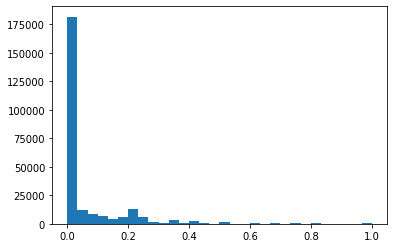

In [8]:
plt.hist(df['rare-features_ring_fraction'], range=(0, 1), bins=30)

In [9]:
def show_galaxies(df, start_index=0, crop_size=50):
    fig, axes = plt.subplots(ncols=5, nrows=2, figsize=(12, 5))
    all_axes = [ax for row in axes for ax in row]
    for n in range(10):
        galaxy = df.iloc[start_index+n]
        im = Image.open(galaxy['local_png_loc']).crop((50, 50, 424-crop_size, 424-crop_size))
        ax = all_axes[n]
        ax.imshow(im)
        ax.axis(False)
        ax.text(30, 30, 'R. Tags: {:.0f}'.format(galaxy['tag_count']), color='r')
        ax.text(30, 60, 'R. Frac: {:.2f}'.format(galaxy['rare-features_ring_fraction']), color='r')
#         ax.text(30, 60, 'Feat: {:.2f}'.format(galaxy['smooth-or-featured_featured-or-disk_fraction']), color='r')
#         ax.text(30, 90, 'Edge: {:.2f}'.format(1-galaxy['disk-edge-on_no_fraction']), color='r')
    fig.tight_layout()

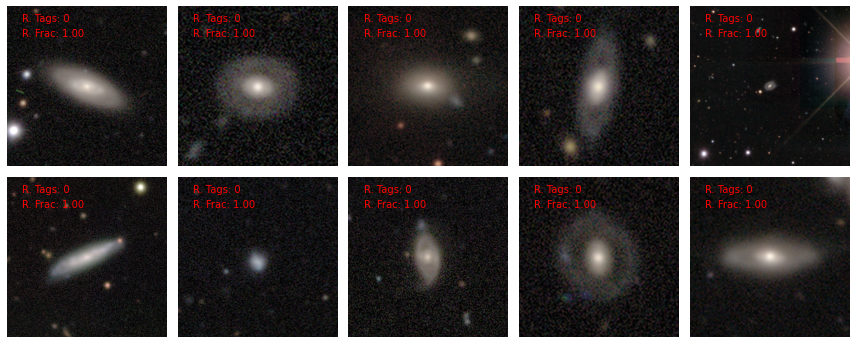

In [10]:
show_galaxies(df.sort_values('rare-features_ring_fraction', ascending=False))

In [11]:
not_very_smooth = df['smooth-or-featured_featured-or-disk_fraction'] > 0.25
face = df['disk-edge-on_no_fraction'] > 0.75
passes_cuts = not_very_smooth & face

cut_df = df[passes_cuts].reset_index(drop=True)
len(cut_df), (cut_df['ring'] > 0).sum()

(82898, 2015)

<AxesSubplot:xlabel='ring', ylabel='rare-features_ring_fraction'>

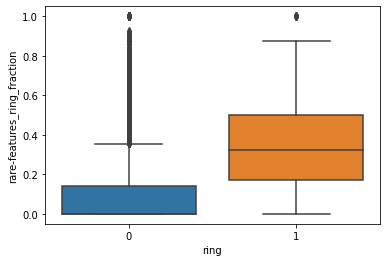

In [12]:
sns.boxplot(data=cut_df, y='rare-features_ring_fraction', x='ring')

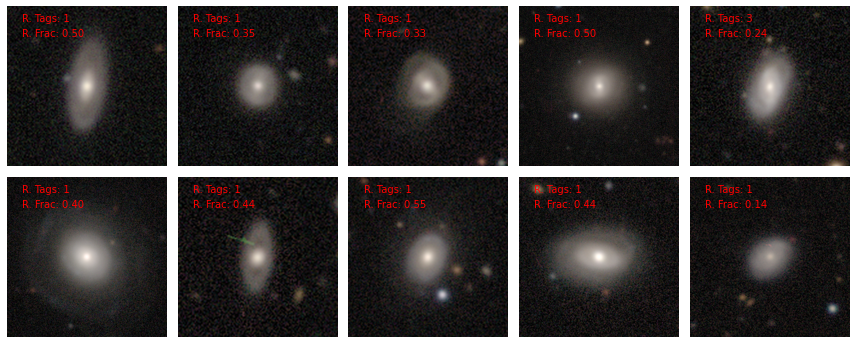

In [13]:
show_galaxies(cut_df.query('ring > 0').sample(10))

In [14]:
# ring fraction seems to recover true rings that weren't tagged quite well, down to a frac of around 0.25
# That's about 20,000 galaxies! (with supersmooth and edgeon cuts for good tags)

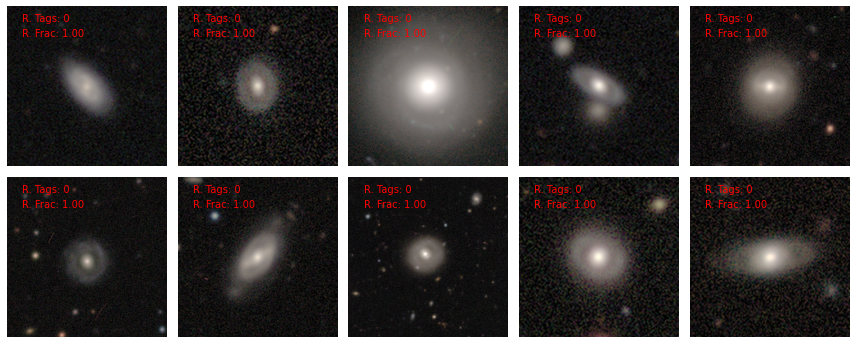

In [15]:
show_galaxies(cut_df.query('ring == 0').sort_values('rare-features_ring_fraction', ascending=False)[:10])

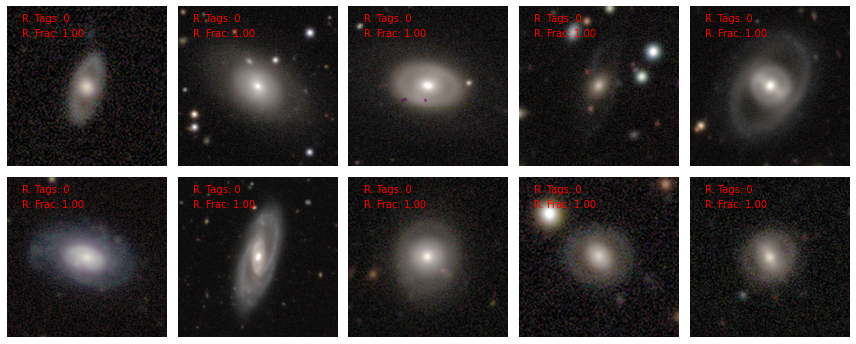

In [16]:
show_galaxies(cut_df.query('ring == 0').sort_values('rare-features_ring_fraction', ascending=False)[100:])

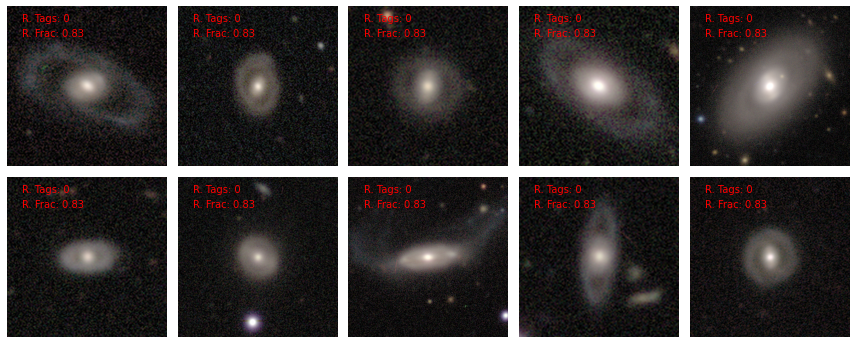

In [17]:
show_galaxies(cut_df.query('ring == 0').sort_values('rare-features_ring_fraction', ascending=False)[300:])

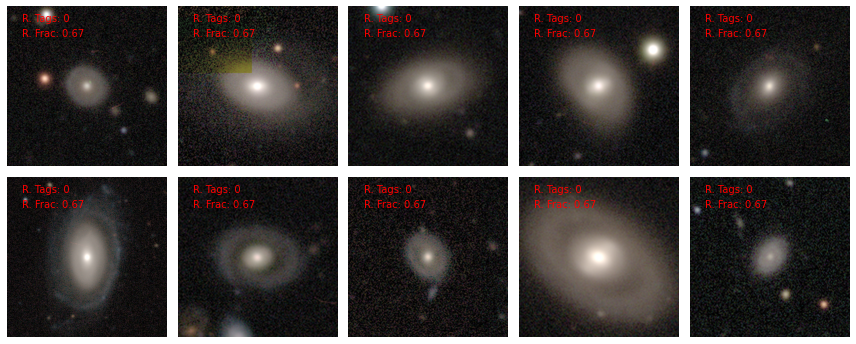

In [18]:
show_galaxies(cut_df.query('ring == 0').sort_values('rare-features_ring_fraction', ascending=False)[1000:])

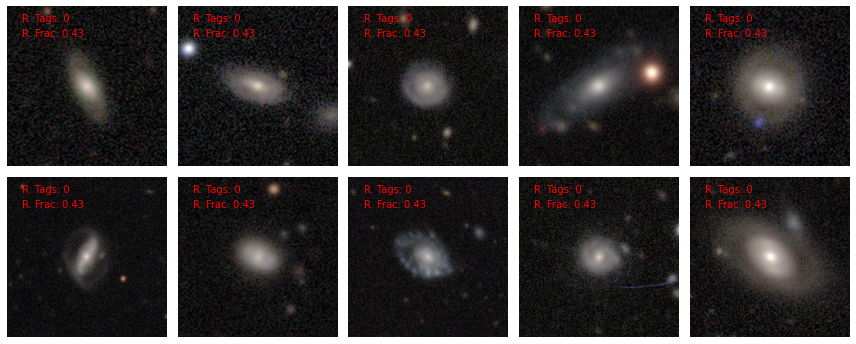

In [19]:
show_galaxies(cut_df.query('ring == 0').sort_values('rare-features_ring_fraction', ascending=False)[4000:])

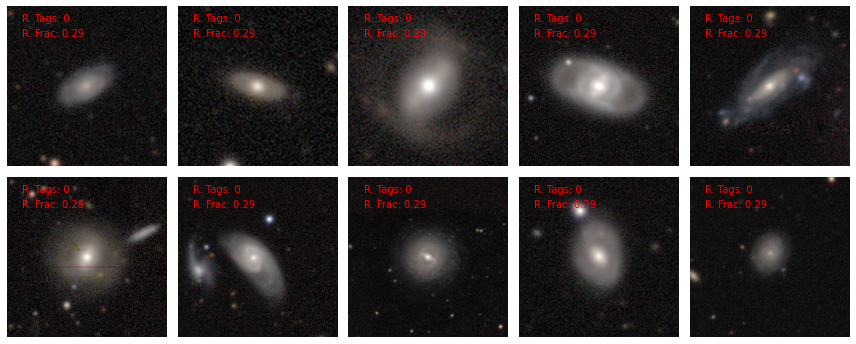

In [20]:
show_galaxies(cut_df.query('ring == 0').sort_values('rare-features_ring_fraction', ascending=False)[8000:])

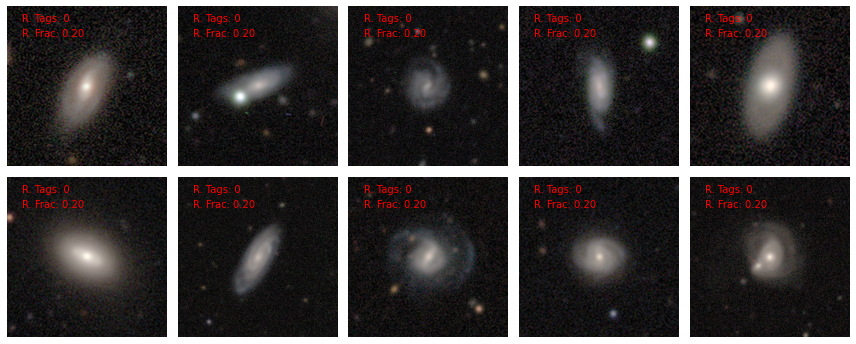

In [21]:
show_galaxies(cut_df.query('ring == 0').sort_values('rare-features_ring_fraction', ascending=False)[15000:])

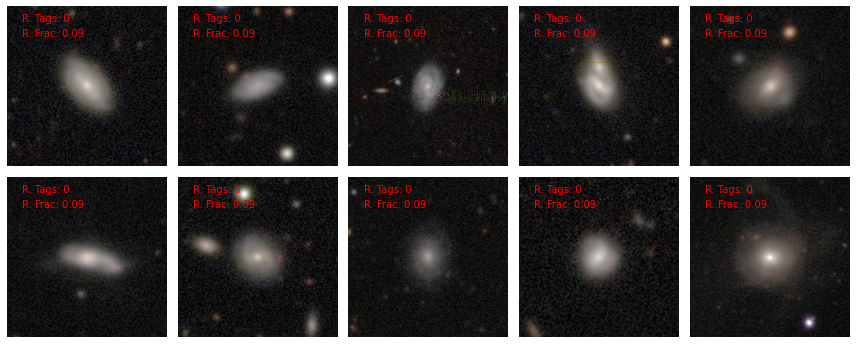

In [22]:
show_galaxies(cut_df.query('ring == 0').sort_values('rare-features_ring_fraction', ascending=False)[25000:])

In [23]:
# ring fraction also picks out galaxies tagged as ring that aren't, down to around a ring frac of 0.05 (about 100 of 2000 ring tags)
# I can use this to automatically clean up the tags a little

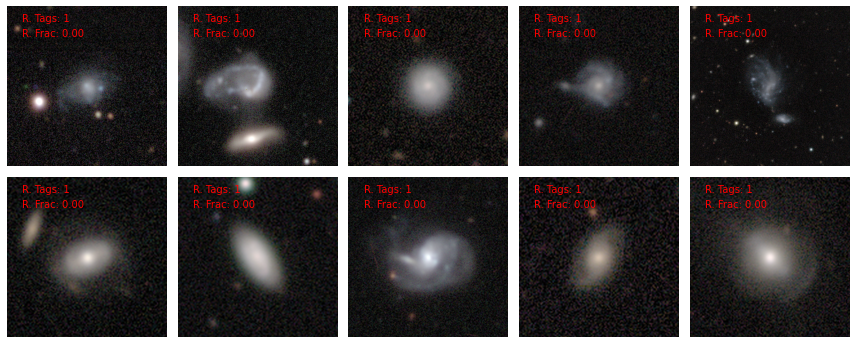

In [24]:
show_galaxies(cut_df.query('ring == 1').sort_values('rare-features_ring_fraction')[:10])

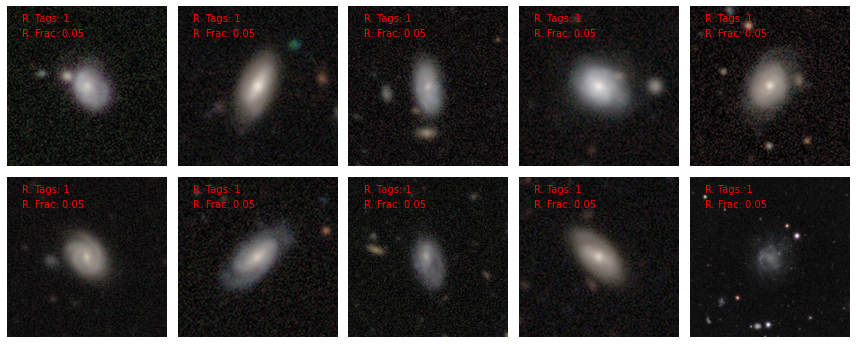

In [25]:
show_galaxies(cut_df.query('ring == 1').sort_values('rare-features_ring_fraction')[100:])

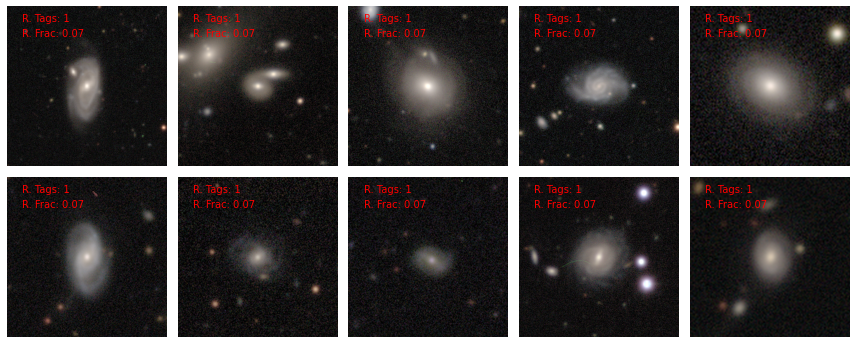

In [26]:
show_galaxies(cut_df.query('ring == 1').sort_values('rare-features_ring_fraction')[150:])

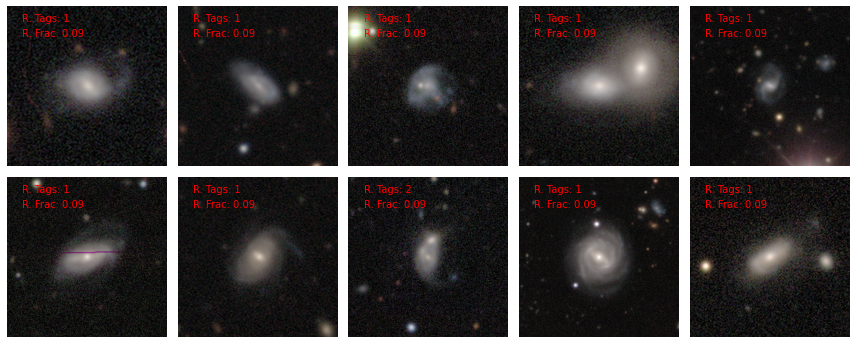

In [27]:
show_galaxies(cut_df.query('ring == 1').sort_values('rare-features_ring_fraction')[200:])

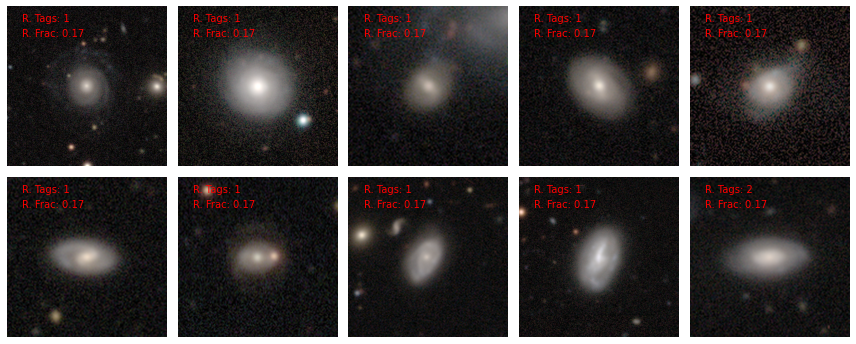

In [28]:
show_galaxies(cut_df.query('ring == 1').sort_values('rare-features_ring_fraction')[500:])

In [29]:
# simple label alternative

ring = cut_df['rare-features_ring_fraction'] > 0.25
not_ring = cut_df['rare-features_ring_fraction'] < 0.05
uncertain = (~ring) & (~not_ring)

In [30]:
print(ring.sum(), not_ring.sum(), uncertain.sum())

9947 50855 22096


In [ ]:
# this is an approximation of a continuous mapping
# could estimate the mapping of p(ring\fraction) with private zooni project randomly sampling equally from bins of fraction
# then use that mapping for a probabilistic loss function etc